<a href="https://colab.research.google.com/github/lakshmigojanece/job_predication/blob/main/Job_Acceptance_Prediction_slm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
import pandas as pd


In [28]:
df = pd.read_csv("/content/HR_Job_Placement_Dataset.csv")


In [29]:
df.nunique()

,0
age_years,14
gender,4
ssc_percentage,47168
hsc_percentage,47770
degree_percentage,49762
degree_specialization,5
technical_score,49273
aptitude_score,49569
communication_score,49064
skills_match_percentage,48804


In [30]:
df

,age_years,gender,ssc_percentage,hsc_percentage,degree_percentage,degree_specialization,technical_score,aptitude_score,communication_score,skills_match_percentage,...,expected_ctc_lpa,company_tier,job_role_match,competition_level,bond_requirement,notice_period_days,layoff_history,employment_gap_months,relocation_willingness,status
0,27,Male,65.061656,83.842578,75.856526,Computer Science,58.221909,89.566305,64.474484,79.548913,...,5.805850,Tier 3,Not Matched,Medium,Not Required,15.0,No,18.0,Not Willing,Not Placed
1,24,Male,67.885626,64.973305,73.093588,Electronics,71.927978,54.591971,61.077306,73.316134,...,10.807739,Tier 1,Matched,High,Required,0.0,NaN,NaN,Not Willing,Not Placed
2,33,Female,73.892471,68.834121,90.196460,Information Technology,72.445041,58.587088,79.494739,75.466980,...,5.476839,Tier 3,Not Matched,Low,Not Required,0.0,No,3.0,Not Willing,Placed
3,31,Male,74.145568,76.255126,75.586731,Mechanical,78.855676,61.022065,53.740386,73.676449,...,9.980580,Tier 2,Matched,Low,Not Required,0.0,Yes,6.0,NaN,Not Placed
4,28,Male,60.475937,65.786336,80.801010,Information Technology,68.286776,65.713731,61.438314,88.994847,...,8.921233,Tier 2,Matched,Medium,Not Required,0.0,No,3.0,Willing,Not Placed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51495,24,Female,65.747180,72.063946,72.247881,Electronics,55.923057,73.208032,69.108895,63.992488,...,6.315211,Tier 1,Matched,Low,Required,0.0,No,3.0,NaN,Not Placed
51496,22,Male,61.921459,66.729203,55.000000,Others,69.525121,70.245612,54.959868,88.514232,...,8.655391,Tier 1,Matched,Medium,Not Required,60.0,No,0.0,Not Willing,Placed
51497,30,Male,75.578202,75.717623,75.048301,Information Technology,73.073239,58.870416,71.219454,79.326789,...,11.538547,Tier 1,Matched,High,Not Required,0.0,No,12.0,NaN,Placed
51498,29,Female,77.327209,56.629227,69.735374,Mechanical,48.270078,61.171900,71.650243,76.318681,...,9.617279,Tier 2,Matched,Medium,Not Required,0.0,Yes,0.0,Willing,Not Placed


In [31]:
df.shape

(51500, 26)

In [32]:
df.columns

Index(['age_years', 'gender', 'ssc_percentage', 'hsc_percentage',
       'degree_percentage', 'degree_specialization', 'technical_score',
       'aptitude_score', 'communication_score', 'skills_match_percentage',
       'certifications_count', 'internship_experience', 'years_of_experience',
       'career_switch_willingness', 'relevant_experience', 'previous_ctc_lpa',
       'expected_ctc_lpa', 'company_tier', 'job_role_match',
       'competition_level', 'bond_requirement', 'notice_period_days',
       'layoff_history', 'employment_gap_months', 'relocation_willingness',
       'status'],
      dtype='object')

In [33]:
df.dtypes

,0
age_years,int64
gender,object
ssc_percentage,float64
hsc_percentage,float64
degree_percentage,float64
degree_specialization,object
technical_score,float64
aptitude_score,float64
communication_score,float64
skills_match_percentage,float64


In [ ]:
# check Inconsistent categorical values

In [35]:
df.layoff_history.value_counts()

,count
layoff_history,
No,37355
Yes,5678


In [36]:
df.relocation_willingness.value_counts()

,count
relocation_willingness,
Willing,27817
Not Willing,15208


In [37]:
df.status.value_counts()

,count
status,
Not Placed,35921
Placed,15579


In [38]:
df.job_role_match.value_counts()

,count
job_role_match,
Matched,33456
Not Matched,11913


In [39]:
df.bond_requirement.value_counts()

,count
bond_requirement,
Not Required,40231
Required,11269


In [43]:
df.competition_level.value_counts()

,count
competition_level,
Low,21414
Medium,19708
High,10378


In [42]:
df.career_switch_willingness.value_counts()

,count
career_switch_willingness,
Not Willing,28479
Willing,14555


In [44]:
df.relevant_experience.value_counts()

,count
relevant_experience,
Relevant,26305
Not Relevant,16769


In [45]:
df.degree_specialization.value_counts()

,count
degree_specialization,
Others,10463
Electronics,10358
Information Technology,10298
Computer Science,10210
Mechanical,10171


In [53]:
df.company_tier.value_counts() # need changes

,count
company_tier,
Tier 1,19878
Tier 2,19056
Tier 3,12566


In [54]:
df.gender.value_counts() # need changes

,count
gender,
female,25923
male,25577


In [57]:
df.internship_experience.value_counts()# need changes

,count
internship_experience,
no,26948
yes,24552


In [49]:
# changes duplicates names in rows
df['gender'] = df['gender'].astype(str).str.lower()


In [56]:
df['internship_experience'] = df['internship_experience'].astype(str).str.strip()

In [52]:
df['company_tier'] = df['company_tier'].astype(str).str.strip()


In [ ]:
#Duplicate-like records


In [58]:
df.duplicated().sum()


np.int64(1500)

In [59]:
df.drop_duplicates(inplace=True)


In [60]:
df.shape

(50000, 26)

In [61]:
#Missing values,Null value distribution analysis
#Handling missing values using mean, median, or mode


df.isnull().sum()

,0
age_years,0
gender,0
ssc_percentage,2500
hsc_percentage,2000
degree_percentage,0
degree_specialization,0
technical_score,0
aptitude_score,0
communication_score,0
skills_match_percentage,0


In [62]:
df.ssc_percentage.isnull().value_counts()

,count
ssc_percentage,
False,47500
True,2500


In [63]:
df.ssc_percentage.mean(),df.ssc_percentage.median()

(np.float64(70.01527990813705), 69.977809405)

<Axes: >

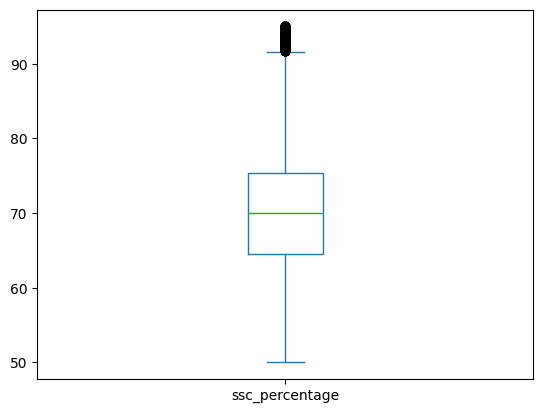

In [64]:
df['ssc_percentage'].plot(kind='box') # no outlier features


In [65]:
df['ssc_percentage'].fillna(df['ssc_percentage'].mean(), inplace=True)


In [66]:
df.hsc_percentage.mean(),df.hsc_percentage.median()# no outlier ,

(np.float64(72.06105358230374), 72.01704586)

<Axes: >

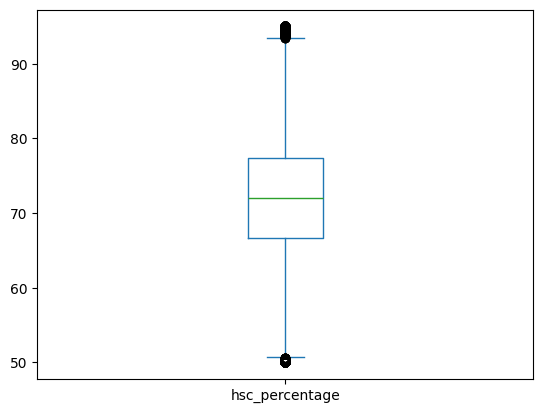

In [67]:
df['hsc_percentage'].plot(kind='box')# no outlier

In [68]:
df['hsc_percentage'].fillna(df['hsc_percentage'].mean(), inplace=True)


In [69]:
df.internship_experience.value_counts()

,count
internship_experience,
no,26164
yes,23836


In [70]:
df['internship_experience'].fillna(df['internship_experience'].mode()[0], inplace=True)# object,string

/tmp/ipython-input-2772933830.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['internship_experience'].fillna(df['internship_experience'].mode()[0], inplace=True)# object,string


In [71]:
df['career_switch_willingness'].fillna(df['career_switch_willingness'].mode()[0], inplace=True)# object,string

/tmp/ipython-input-1275961322.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['career_switch_willingness'].fillna(df['career_switch_willingness'].mode()[0], inplace=True)# object,string


In [108]:
df['degree_specialization'].fillna(df['degree_specialization'].mode()[0], inplace=True)# object,string

/tmp/ipython-input-2708158442.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['degree_specialization'].fillna(df['degree_specialization'].mode()[0], inplace=True)# object,string


In [109]:
df.degree_specialization.isnull().sum()

np.int64(0)

In [74]:
df['relevant_experience'].fillna(df['relevant_experience'].mode()[0], inplace=True)# object,string

/tmp/ipython-input-3333857950.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['relevant_experience'].fillna(df['relevant_experience'].mode()[0], inplace=True)# object,string


In [75]:
df['job_role_match'].fillna(df['job_role_match'].mode()[0], inplace=True)# object,string

/tmp/ipython-input-1359259273.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['job_role_match'].fillna(df['job_role_match'].mode()[0], inplace=True)# object,string


In [76]:
df.notice_period_days.mean(),df.notice_period_days.median() # high outlier

(np.float64(20.10924733845011), 15.0)

<Axes: >

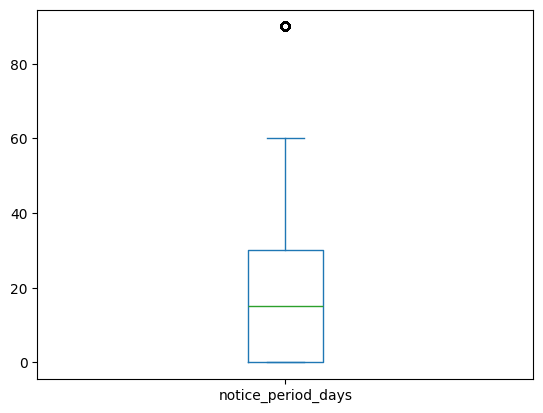

In [77]:
df.notice_period_days.plot(kind='box')

In [78]:
df['notice_period_days'].fillna(df['notice_period_days'].median(), inplace=True)

In [79]:
df['layoff_history'].fillna(df['layoff_history'].mode()[0], inplace=True)# object,string

/tmp/ipython-input-1233074798.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['layoff_history'].fillna(df['layoff_history'].mode()[0], inplace=True)# object,string


In [80]:
df.employment_gap_months.mean(),df.employment_gap_months.median()# high outlier,right skew

(np.float64(3.058922111631139), 0.0)

<Axes: >

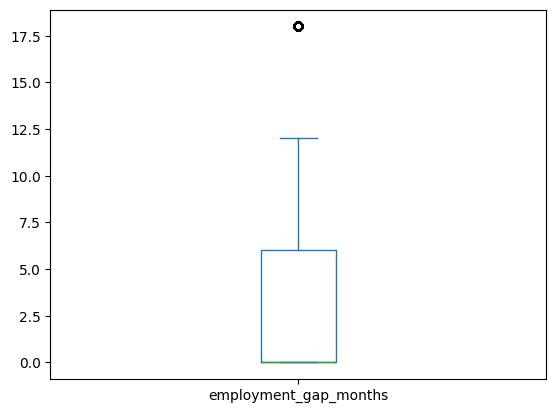

In [81]:
df.employment_gap_months.plot(kind='box')

In [82]:
df['employment_gap_months'].fillna(df['employment_gap_months'].median(), inplace=True)

In [83]:
df['relocation_willingness'].fillna(df['relocation_willingness'].mode()[0],inplace=True)# object, string

/tmp/ipython-input-4067879123.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['relocation_willingness'].fillna(df['relocation_willingness'].mode()[0],inplace=True)# object, string


In [84]:
df.isnull().sum()

,0
age_years,0
gender,0
ssc_percentage,0
hsc_percentage,0
degree_percentage,0
degree_specialization,0
technical_score,0
aptitude_score,0
communication_score,0
skills_match_percentage,0


In [60]:
#Step 2: Data Understanding
    # Dataset contains features covering:


#Academic performance(ssc_percentage,hsc_percentage,degree_percentage,degree_specialization)



#Skills and certifications(technical_score, skills_match_percentage,certifications_count)


#Work experience(internship_experience,years_of_experience,relevant_experience,career_switch_willingness,employment_gap_months)


#Interview performance(aptitude_score,communication_score)

#Job Market Conditions(Company tier,Job role match,Competition level,Bond requirement,Notice period days,Relocation willingness,Layoff history)


#compensation history (previous_ctc_lpa,expected_ctc_lpa)

#Demographic(age_years,gender)

#Placement outcome (Target Variable(status))--->(Placed,Not Placed)


In [ ]:
#Step 3: Data Cleaning & Preprocessing
#Key preprocessing steps include:
#Handling missing values using mean, median, or mode


#Encoding categorical variables (Label / One-Hot Encoding)


#Feature scaling for numerical columns


#Correcting inconsistent categorical labels


#Ensuring logical consistency across features


In [ ]:
#Encoding categorical variables (Label / One-Hot Encoding)


In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 0 to 49999
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age_years                  50000 non-null  int64  
 1   gender                     50000 non-null  object 
 2   ssc_percentage             50000 non-null  float64
 3   hsc_percentage             50000 non-null  float64
 4   degree_percentage          50000 non-null  float64
 5   degree_specialization      50000 non-null  object 
 6   technical_score            50000 non-null  float64
 7   aptitude_score             50000 non-null  float64
 8   communication_score        50000 non-null  float64
 9   skills_match_percentage    50000 non-null  float64
 10  certifications_count       50000 non-null  int64  
 11  internship_experience      50000 non-null  object 
 12  years_of_experience        50000 non-null  int64  
 13  career_switch_willingness  50000 non-null  object 


In [ ]:
#label encoding -----> two values(label coding changes 1 and 0)


In [86]:
df['gender']=df['gender'].map({'male':1,'female':0})

In [87]:
df.gender.value_counts()

,count
gender,
0,25137
1,24863


In [88]:
df['internship_experience']=df['internship_experience'].map({'yes':1,'no':0})

In [89]:
df.internship_experience.value_counts()

,count
internship_experience,
0,26164
1,23836


In [90]:
df.internship_experience.isnull().sum()

np.int64(0)

In [91]:
df['career_switch_willingness']=df['career_switch_willingness'].map({'Willing':1,'Not Willing':0})

In [92]:
df.career_switch_willingness.value_counts()

,count
career_switch_willingness,
0,35868
1,14132


In [93]:
df['relevant_experience']=df['relevant_experience'].map({'Relevant':1,'Not Relevant':0})

In [94]:
df.relevant_experience.value_counts()

,count
relevant_experience,
1,33719
0,16281


In [95]:
df['job_role_match']=df['job_role_match'].map({'Matched':1,'Not Matched':0})

In [96]:
df.job_role_match.value_counts()

,count
job_role_match,
1,38420
0,11580


In [97]:
df['bond_requirement']=df['bond_requirement'].map({'Required':1,'Not Required':0})

In [98]:
df.bond_requirement.value_counts()

,count
bond_requirement,
0,39060
1,10940


In [99]:
df['layoff_history']=df['layoff_history'].map({'Yes':1,'No':0})

In [100]:
df.layoff_history.value_counts()

,count
layoff_history,
0,44475
1,5525


In [101]:
df['relocation_willingness']=df['relocation_willingness'].map({'Willing':1,'Not Willing':0})

In [102]:
df.relocation_willingness.value_counts()

,count
relocation_willingness,
1,35219
0,14781


In [103]:
df['status']=df['status'].map({'Placed':1,'Not Placed':0})

In [104]:
df.status.value_counts()

,count
status,
0,34870
1,15130


In [105]:

df['degree_specialization'] = df['degree_specialization'].map({'0thers':0,'Electronics':1,'Information Technology':2,'Computer Science':3,'Mechanical':4})



In [106]:
df.degree_specialization.value_counts()

,count
degree_specialization,
1.0,10052
2.0,10012
3.0,9907
4.0,9885


In [110]:
df.degree_specialization.isnull().sum()

np.int64(0)

In [111]:
df['competition_level']=df['competition_level'].map({'Medium':1,'Low':0,'High':2})

In [112]:
df.competition_level.value_counts()

,count
competition_level,
0,20841
1,19114
2,10045


In [113]:
df.company_tier=df.company_tier.map({'Tier 1':1,'Tier 2':2,'Tier 3':3})

In [114]:
df.company_tier.value_counts()

,count
company_tier,
1,19305
2,18483
3,12212


In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50000 entries, 0 to 49999
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   age_years                  50000 non-null  int64  
 1   gender                     50000 non-null  int64  
 2   ssc_percentage             50000 non-null  float64
 3   hsc_percentage             50000 non-null  float64
 4   degree_percentage          50000 non-null  float64
 5   degree_specialization      50000 non-null  float64
 6   technical_score            50000 non-null  float64
 7   aptitude_score             50000 non-null  float64
 8   communication_score        50000 non-null  float64
 9   skills_match_percentage    50000 non-null  float64
 10  certifications_count       50000 non-null  int64  
 11  internship_experience      50000 non-null  int64  
 12  years_of_experience        50000 non-null  int64  
 13  career_switch_willingness  50000 non-null  int64  


In [ ]:
#diagnosis

In [116]:
total = len(df)
total


50000

In [117]:
df.status.value_counts()

,count
status,
0,34870
1,15130


In [118]:
(df['status'].value_counts() / len(df)) * 100   # % of placed vs not placed


,count
status,
0,69.74
1,30.26


In [ ]:
#placed students 30.26%, not-placed students 69.74%

In [119]:
#academic_performance, Average marks by placement
df.groupby('status')[['ssc_percentage','hsc_percentage','degree_percentage']].mean()


,ssc_percentage,hsc_percentage,degree_percentage
status,,,
0,70.034858,72.074657,74.039665
1,69.970158,72.029702,73.930357


In [120]:
#insights placed students is not high acedemic_performance

In [121]:
df['academic_performance'] = (df['ssc_percentage'] + df['hsc_percentage'] + df['degree_percentage']) / 3
df.groupby('status')['academic_performance'].mean()


,academic_performance
status,
0,72.049726
1,71.976739


In [ ]:
#placed students is not high percentage in academic_performance and not placed students is a high percentage in academic_performance

In [97]:
#interview performance

In [122]:
df.groupby('status')[['technical_score','aptitude_score','communication_score']].mean()


,technical_score,aptitude_score,communication_score
status,,,
0,64.881945,63.735809,65.460389
1,75.300597,64.589623,67.568646


In [123]:
df['interview performance'] = (df['technical_score'] + df['aptitude_score'] + df['communication_score']) / 3
df.groupby('status')['interview performance'].mean()


,interview performance
status,
0,64.692714
1,69.152955


In [ ]:
#interview round is performed is high level students is placed and low performance students is not placed

In [100]:
#Skills Match %

In [124]:
sm=df.groupby('status')['skills_match_percentage'].mean()
sm

,skills_match_percentage
status,
0,72.398552
1,77.495014


In [125]:
sm['skills_match_percentage']=(sm[1]/(sm[0]+sm[1]))*100
sm

,skills_match_percentage
status,
0,72.398552
1,77.495014
skills_match_percentage,51.700027


In [ ]:
#insights ----> placed students is performed high level for skills_match_percentage and not placed students is performed low level

In [ ]:
#Certifications

In [126]:
df.certifications_count.value_counts()

,count
certifications_count,
1,17233
0,12340
2,12096
3,5632
4,1984
5,557
6,116
7,33
8,9


In [127]:
cc=pd.crosstab(df['certifications_count'], df['status'])
cc

status,0,1
certifications_count,,
0,8575,3765
1,12026,5207
2,8458,3638
3,3915,1717
4,1369,615
5,412,145
6,81,35
7,28,5
8,6,3


In [128]:
cc['certifications_count']=(cc[1]/(cc[0]+cc[1]))*100
cc

status,0,1,certifications_count
certifications_count,,,
0,8575,3765,30.510535
1,12026,5207,30.215285
2,8458,3638,30.076058
3,3915,1717,30.486506
4,1369,615,30.997984
5,412,145,26.032316
6,81,35,30.172414
7,28,5,15.151515
8,6,3,33.333333


In [106]:

# Even candidates with 0 certifications get placed,and high no of cc students is placed high 33.33%

In [200]:
#Internship & Experience Diagnosis

In [129]:
df.internship_experience.value_counts()

,count
internship_experience,
0,26164
1,23836


In [130]:
ie=pd.crosstab(df['internship_experience'], df['status'])
ie

status,0,1
internship_experience,,
0,19861,6303
1,15009,8827


In [131]:
ie['internship_experience'] = (ie[1] / (ie[0] + ie[1])) * 100

ie


status,0,1,internship_experience
internship_experience,,,
0,19861,6303,24.090353
1,15009,8827,37.032220


In [203]:
#internship_experience say no students is also placed but high no of students placed in internship experience 34.25 %

In [132]:
df.years_of_experience.value_counts()


,count
years_of_experience,
0,14952
1,13508
2,9966
3,6538
4,3548
5,1488


In [133]:
ct=pd.crosstab(df['years_of_experience'],df['status'])
ct

status,0,1
years_of_experience,,
0,12891,2061
1,10249,3259
2,6369,3597
3,3334,3204
4,1500,2048
5,527,961


In [134]:
ct['years_of_experience'] = (ct[1] / (ct[0] + ct[1])) * 100

ct


status,0,1,years_of_experience
years_of_experience,,,
0,12891,2061,13.784109
1,10249,3259,24.126444
2,6369,3597,36.092715
3,3334,3204,49.005812
4,1500,2048,57.722661
5,527,961,64.583333


In [ ]:
# Even candidates with 0 years_of_experience get placed, but high  year of experience is 64.58 percentage is placed


In [135]:
re=pd.crosstab(df['relevant_experience'], df['status'])
re

status,0,1
relevant_experience,,
0,12509,3772
1,22361,11358


In [136]:
re['relevant_experience'] = (re[1] / (re[0] + re[1])) * 100

re



status,0,1,relevant_experience
relevant_experience,,,
0,12509,3772,23.168110
1,22361,11358,33.684273


In [ ]:
#relevant_experience is yes condition is 33.68 % is placed

In [137]:
csw=pd.crosstab(df['career_switch_willingness'], df['status'])
csw

status,0,1
career_switch_willingness,,
0,25597,10271
1,9273,4859


In [138]:
csw['career_switch_willingness'] = (csw[1] / (csw[0] + csw[1])) * 100
csw

status,0,1,career_switch_willingness
career_switch_willingness,,,
0,25597,10271,28.635553
1,9273,4859,34.382961


In [ ]:
#career_switch_willingness is not interserted students is also placed but high 34.38 percentage  interested students is also placed

In [139]:
df.groupby('status')[['age_years','gender','previous_ctc_lpa','expected_ctc_lpa']].mean()


,age_years,gender,previous_ctc_lpa,expected_ctc_lpa
status,,,,
0,27.520792,0.496473,4.702775,8.336744
1,27.472174,0.499075,5.172655,7.230688


In [140]:
jrm=pd.crosstab(df['job_role_match'], df['status'])
jrm

status,0,1
job_role_match,,
0,9766,1814
1,25104,13316


In [141]:
jrm['job_role_match'] = (jrm[1] / (jrm[0] + jrm[1])) * 100
jrm

status,0,1,job_role_match
job_role_match,,,
0,9766,1814,15.664940
1,25104,13316,34.659032


In [142]:
ct=pd.crosstab(df['company_tier'],df['status'])
ct

status,0,1
company_tier,,
1,13526,5779
2,12861,5622
3,8483,3729


In [143]:
ct['company_tier']=(ct[1]/(ct[0]+ct[1]))*100
ct

status,0,1,company_tier
company_tier,,,
1,13526,5779,29.935250
2,12861,5622,30.417140
3,8483,3729,30.535539


In [144]:
cl=pd.crosstab(df['competition_level'],df['status'])
cl

status,0,1
competition_level,,
0,14198,6643
1,13016,6098
2,7656,2389


In [145]:
cl['competition_level']=(cl[1]/(cl[0]+cl[1]))*100
cl

status,0,1,competition_level
competition_level,,,
0,14198,6643,31.874670
1,13016,6098,31.903317
2,7656,2389,23.782977


In [146]:
br=pd.crosstab(df['bond_requirement'],df['status'])
br

status,0,1
bond_requirement,,
0,26520,12540
1,8350,2590


In [147]:
br['bond_requirement']=(br[1]/(br[0]+br[1]))*100
br

status,0,1,bond_requirement
bond_requirement,,,
0,26520,12540,32.104455
1,8350,2590,23.674589


In [148]:
npd=pd.crosstab(df['notice_period_days'],df['status'])
npd

status,0,1
notice_period_days,,
0.0,14266,6810
15.0,7903,3508
30.0,7090,2863
60.0,3723,1361
90.0,1888,588


In [149]:
npd['notice_period_days']=(npd[1]/(npd[0]+npd[1]))*100
npd

status,0,1,notice_period_days
notice_period_days,,,
0.0,14266,6810,32.311634
15.0,7903,3508,30.742266
30.0,7090,2863,28.765196
60.0,3723,1361,26.770260
90.0,1888,588,23.747981


In [150]:
Layoff=pd.crosstab(df['layoff_history'],df['status'])
Layoff

status,0,1
layoff_history,,
0,30207,14268
1,4663,862


In [151]:
Layoff['layoff_history']=(Layoff[1]/(Layoff[0]+Layoff[1]))*100
Layoff


status,0,1,layoff_history
layoff_history,,,
0,30207,14268,32.080944
1,4663,862,15.601810


In [152]:
egm=pd.crosstab(df['employment_gap_months'],df['status'])
egm

status,0,1
employment_gap_months,,
0.0,18200,8773
3.0,7038,3090
6.0,5374,2063
12.0,3025,917
18.0,1233,287


In [153]:
#egm['employment_gap_months']=(egm[1]/(egm[0]+egm[1]))*100
egm['employment_gap_months']=(egm[0]/(egm[0]+egm[1]))*100

egm

status,0,1,employment_gap_months
employment_gap_months,,,
0.0,18200,8773,67.474882
3.0,7038,3090,69.490521
6.0,5374,2063,72.260320
12.0,3025,917,76.737697
18.0,1233,287,81.118421


In [154]:
reloc=pd.crosstab(df['relocation_willingness'],df['status'])
reloc

status,0,1
relocation_willingness,,
0,10897,3884
1,23973,11246


In [155]:
#reloc['relocation_willingness']=(reloc[1]/(reloc[0]+reloc[1]))*100
reloc['relocation_willingness']=(reloc[0]/(reloc[0]+reloc[1]))*100

reloc

status,0,1,relocation_willingness
relocation_willingness,,,
0,10897,3884,73.723023
1,23973,11246,68.068372


In [230]:
#reason for placed ---->(academic_performance->71.97% low percentage is also ,age_years--> no difference, 'gender'---> no difference, '
'interview score'---> high 69.15%, 'skills_match_percentage'--->yes is high 77.49%,
       'certifications_count'--->8 no of count is placed is high, 'internship_experience'---->yes is high(34.25% & no 30.16%),
       'years_of_experience'---->5 year of experience yes is high(34.25)(n0 30.16),
       'career_switch_willingness'-->yes is high(34.38)n0(25.633), 'relevant_experience'---->yes(33.68)no(23.16),
       'expected_ctc_lpa'--> medium, 'company_tier'---> high, 'job_role_match'--->yes,
       'competition_level'--->high, 'bond_requirement'---> yes, 'notice_period_days'--->0 days placed,
       'layoff_history'---> no is placed, 'employment_gap_months'---->0 months is placed, 'relocation_willingness'---> yes placed,
       'status'---->placed(30.26%))

SyntaxError: unmatched ')' (ipython-input-2163821990.py, line 9)

Reasons for Placed Candidates – Insights

Academic performance is moderate (~71.97%), showing that high marks alone are not mandatory for placement

Age and gender do not influence placement outcomes

Interview performance is strong (~69.15%), supporting selection

Skills match percentage is high (~77.49%), which is the most important factor

Certifications count is higher (around 8), indicating continuous learning

Internship experience significantly improves placement chances

Years of experience (around 5 years) positively impact employability

Career switch willingness increases job opportunities

Relevant experience strongly supports placement decisions

Expected CTC is in a medium and realistic range

Company tier preference is higher for placed candidates

Job role match is positive

Competition level is handled well

Bond requirement acceptance reduces hiring risk

Notice period is 0 days, allowing immediate joining

No layoff history increases employer trust

No employment gap indicates career stability

Relocation willingness increases placement probability

➡️ Total placed candidates: 30.26%

In [ ]:
#reason for not placed--->academic_performance->72.0497% high percentage  ,age_years--> no difference, 'gender'---> no difference, '
'interview score'---> low , 'skills_match_percentage'--->no is high(low),
       'certifications_count'--->low, 'internship_experience'---->no low,
       'years_of_experience'---->low,
       'career_switch_willingness'-->low, 'relevant_experience'---->no low,
       'expected_ctc_lpa'--> expected high, 'company_tier'---> low, 'job_role_match'--->no low,
       'competition_level'--->low, 'bond_requirement'---> no low, 'notice_period_days'--->days is high,
       'layoff_history'---> yes is not placed, 'employment_gap_months'---->high, 'relocation_willingness'--->no,
       'status'---->not placed(69.74%))

Reasons for Not Placed Candidates – Insights

Academic performance is slightly higher (~72.05%) but lacks supporting skills

Age and gender do not affect placement

Interview performance is poor

Skills match percentage is low

Certifications count is low

No internship experience reduces employability

Limited work experience

Low career switch willingness

Lack of relevant experience

Expected CTC is higher than market expectations

Company tier preference is lower

Job role mismatch

Low competition handling ability

Bond requirement not accepted, increasing hiring risk

Notice period is high

Layoff history increases perceived risk

High employment gap indicates instability

Relocation unwillingness limits job opportunities

➡️ Total not placed candidates: 69.74%

In [156]:
df.columns

Index(['age_years', 'gender', 'ssc_percentage', 'hsc_percentage',
       'degree_percentage', 'degree_specialization', 'technical_score',
       'aptitude_score', 'communication_score', 'skills_match_percentage',
       'certifications_count', 'internship_experience', 'years_of_experience',
       'career_switch_willingness', 'relevant_experience', 'previous_ctc_lpa',
       'expected_ctc_lpa', 'company_tier', 'job_role_match',
       'competition_level', 'bond_requirement', 'notice_period_days',
       'layoff_history', 'employment_gap_months', 'relocation_willingness',
       'status', 'academic_performance', 'interview performance'],
      dtype='object')

In [ ]:
# Step 4: Exploratory Data Analysis (EDA)
#EDA is performed to uncover patterns and trends such as:


In [157]:
#Interview score vs job acceptance
df.groupby('status')[['technical_score','aptitude_score','communication_score']].mean()


,technical_score,aptitude_score,communication_score
status,,,
0,64.881945,63.735809,65.460389
1,75.300597,64.589623,67.568646


In [158]:
df['interview performance'] = (df['technical_score'] + df['aptitude_score'] + df['communication_score']) / 3
df.groupby('status')['interview performance'].mean()


,interview performance
status,
0,64.692714
1,69.152955


In [234]:
#Skills match percentage impact on placement


In [159]:
df.groupby('status')['skills_match_percentage'].mean()


,skills_match_percentage
status,
0,72.398552
1,77.495014


In [ ]:
#Company tier vs acceptance rate


In [160]:
df.groupby('status')['company_tier'].mean()

,company_tier
status,
0,1.855377
1,1.864508


In [161]:
pd.crosstab(df['company_tier'], df['status'])

status,0,1
company_tier,,
1,13526,5779
2,12861,5622
3,8483,3729


In [162]:
pd.crosstab(df['company_tier'], df['status'], normalize='index') * 100


status,0,1
company_tier,,
1,70.064750,29.935250
2,69.582860,30.417140
3,69.464461,30.535539


In [239]:
#Experience vs placement probability


In [163]:
df.groupby('status')['years_of_experience'].mean()


,years_of_experience
status,
0,1.193691
1,2.185195


In [164]:
#years_of_experience
pd.crosstab(df['years_of_experience'],df['status'],normalize='index') * 100


status,0,1
years_of_experience,,
0,86.215891,13.784109
1,75.873556,24.126444
2,63.907285,36.092715
3,50.994188,49.005812
4,42.277339,57.722661
5,35.416667,64.583333


In [165]:
#internship_experience
pd.crosstab(df['internship_experience'],df['status'],normalize='index') * 100

status,0,1
internship_experience,,
0,75.909647,24.090353
1,62.967780,37.032220


In [166]:
#relevant_experience
pd.crosstab(df['relevant_experience'],df['status'],normalize='index') * 100

status,0,1
relevant_experience,,
0,76.831890,23.168110
1,66.315727,33.684273


In [167]:
df.columns

Index(['age_years', 'gender', 'ssc_percentage', 'hsc_percentage',
       'degree_percentage', 'degree_specialization', 'technical_score',
       'aptitude_score', 'communication_score', 'skills_match_percentage',
       'certifications_count', 'internship_experience', 'years_of_experience',
       'career_switch_willingness', 'relevant_experience', 'previous_ctc_lpa',
       'expected_ctc_lpa', 'company_tier', 'job_role_match',
       'competition_level', 'bond_requirement', 'notice_period_days',
       'layoff_history', 'employment_gap_months', 'relocation_willingness',
       'status', 'academic_performance', 'interview performance'],
      dtype='object')

In [ ]:
#Competition level vs job acceptance


In [168]:
pd.crosstab(df['competition_level'],df['status'],normalize='index') * 100

status,0,1
competition_level,,
0,68.125330,31.874670
1,68.096683,31.903317
2,76.217023,23.782977


In [169]:
#Correlation analysis among numeric features
numeric_df = df.select_dtypes(include='number')
numeric_df.corr()['status'].sort_values(ascending=False)


,status
status,1.000000
technical_score,0.403706
interview performance,0.335114
years_of_experience,0.331100
skills_match_percentage,0.198423
job_role_match,0.174424
internship_experience,0.140708
relevant_experience,0.107273
previous_ctc_lpa,0.101480
communication_score,0.097831


In [ ]:
#Step 5: Feature Engineering


In [170]:
#Experience category (Fresher / Junior / Senior)
def experience_category(x):
    if x == 0:
        return 'Fresher'
    elif x <= 3:
        return 'Junior'
    else:
        return 'Senior'

df['experience_category'] = df['years_of_experience'].apply(experience_category)




In [171]:
df['experience_category']

,experience_category
0,Junior
1,Fresher
2,Junior
3,Fresher
4,Fresher
...,...
49995,Junior
49996,Fresher
49997,Fresher
49998,Fresher


In [249]:
#Academic performance bands

In [172]:
df['academic_performance'] = (df['ssc_percentage'] + df['hsc_percentage'] + df['degree_percentage']) / 3
def academic_band(x):
  if x<60:
    return 'low'
  elif x<75:
    return 'medium'
  else:
    return 'high'
df['academic_band']=df['academic_performance'].apply(academic_band)


In [173]:
df['academic_band']

,academic_band
0,medium
1,medium
2,high
3,high
4,medium
...,...
49995,high
49996,medium
49997,medium
49998,high


In [ ]:
#Skills match level (Low / Medium / High)

In [174]:
df.skills_match_percentage.value_counts()

,count
skills_match_percentage,
100.000000,807
45.000000,391
53.909333,1
69.423963,1
64.547411,1
...,...
62.713796,1
68.866521,1
71.970554,1


In [175]:
def skills_match_level (x):
  if x<50:
    return 'Low'
  elif x<=75:
    return 'Medium'
  else:
    return 'High'
df['skills_match_level']   =df['skills_match_percentage'].apply(skills_match_level)



In [176]:
df['skills_match_level']

,skills_match_level
0,High
1,Medium
2,High
3,Medium
4,High
...,...
49995,Medium
49996,High
49997,Medium
49998,High


In [ ]:
#Interview performance category

In [177]:
df['interview performance'] = (df['technical_score'] + df['aptitude_score'] + df['communication_score']) / 3
def interview_performance_category(x):
  if x<50:
    return 'poor'
  elif x<=70:
    return 'average'
  else:
    return 'good'
df['interview_performance_category']=df['interview performance'].apply(interview_performance_category)


In [178]:
df['interview_performance_category']

,interview_performance_category
0,good
1,average
2,good
3,average
4,average
...,...
49995,good
49996,average
49997,average
49998,average


In [ ]:
#Placement probability score

In [179]:
df['Placement_probability_score']=(df['interview performance']*0.4+
                                   df['skills_match_percentage']*0.4+
                                   df['years_of_experience']*5)

In [180]:
df['Placement_probability_score']

,Placement_probability_score
0,65.121258
1,54.339421
2,63.257041
3,55.286330
4,61.656448
...,...
49995,63.045694
49996,55.194692
49997,42.617396
49998,61.184580


In [158]:
df[['status',
    'experience_category',
    'academic_band',
    'skills_match_level',
    'interview_performance_category',
    'Placement_probability_score',
    ]].head()

,status,experience_category,academic_band,skills_match_level,interview_performance_category,Placement_probability_score
0,0,Junior,medium,High,good,65.121258
1,0,Fresher,medium,Medium,average,54.339421
2,1,Junior,high,High,good,63.257041
3,0,Fresher,high,Medium,average,55.286330
4,0,Fresher,medium,High,average,61.656448


In [181]:
df[['status',
    'experience_category',
    'academic_band',
    'skills_match_level',
    'interview_performance_category',
    'Placement_probability_score',
    ]].tail()

,status,experience_category,academic_band,skills_match_level,interview_performance_category,Placement_probability_score
49995,0,Junior,high,Medium,good,63.045694
49996,0,Fresher,medium,High,average,55.194692
49997,0,Fresher,medium,Medium,average,42.617396
49998,0,Fresher,high,High,average,61.184580
49999,0,Junior,medium,Medium,average,58.788485


In [ ]:
 #Step 7: Machine Learning Modeling
#Business-focused ML modeling includes:
#Defining status as the target variable

#Placed → Job Accepted (1)


#Not Placed → Job Rejected (0)


In [182]:
df.columns

Index(['age_years', 'gender', 'ssc_percentage', 'hsc_percentage',
       'degree_percentage', 'degree_specialization', 'technical_score',
       'aptitude_score', 'communication_score', 'skills_match_percentage',
       'certifications_count', 'internship_experience', 'years_of_experience',
       'career_switch_willingness', 'relevant_experience', 'previous_ctc_lpa',
       'expected_ctc_lpa', 'company_tier', 'job_role_match',
       'competition_level', 'bond_requirement', 'notice_period_days',
       'layoff_history', 'employment_gap_months', 'relocation_willingness',
       'status', 'academic_performance', 'interview performance',
       'experience_category', 'academic_band', 'skills_match_level',
       'interview_performance_category', 'Placement_probability_score'],
      dtype='object')

In [183]:
X = df[
    ['skills_match_percentage',
     'certifications_count',
     'internship_experience',
     'years_of_experience',
     'career_switch_willingness',
     'relevant_experience',
     'expected_ctc_lpa',
     'job_role_match',
     'bond_requirement',
     'notice_period_days',
     'layoff_history',
     'employment_gap_months',
     'relocation_willingness',
     'academic_performance',
     'interview performance']
]



In [184]:
y = df['status']

In [185]:
print(type(X))
print(type(y))
print(X.shape)
print(y.shape)


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
(50000, 15)
(50000,)


In [ ]:
#Split Data (Train & Test)

In [186]:
from sklearn.model_selection import train_test_split# train --> 80%(model learning) , test----> 20%(model testing)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


In [204]:
# Scale the Data

In [187]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)


In [188]:
scaler

StandardScaler()

In [ ]:
#Logistic Regression (Classification Model)

In [189]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train_scaled, y_train)


LogisticRegression()

In [ ]:
# Prediction

In [190]:
y_pred = model.predict(X_test_scaled)


In [ ]:
# Accuracy

In [191]:
from sklearn.metrics import accuracy_score

print("Accuracy:", accuracy_score(y_test, y_pred))


Accuracy: 0.8263


In [ ]:
#test model good prediction

In [ ]:
#Classification Report

In [192]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.85      0.91      0.88      6930
           1       0.75      0.65      0.70      3070

    accuracy                           0.83     10000
   macro avg       0.80      0.78      0.79     10000
weighted avg       0.82      0.83      0.82     10000



In [ ]:
#Analyst Tasks (EDA & ML Analytics)


In [ ]:
#####Candidate Performance Analysis


In [193]:
#Academic scores vs placement
df.groupby('status')[['ssc_percentage', 'hsc_percentage', 'degree_percentage']].mean()



,ssc_percentage,hsc_percentage,degree_percentage
status,,,
0,70.034858,72.074657,74.039665
1,69.970158,72.029702,73.930357


In [ ]:
#Skills match vs interview performance


In [194]:
df.groupby('status')[['skills_match_percentage','interview performance']].mean()


,skills_match_percentage,interview performance
status,,
0,72.398552,64.692714
1,77.495014,69.152955


In [ ]:
#Certification impact on job acceptance


In [195]:
pd.crosstab(df['certifications_count'], df['status'], normalize='index')*100


status,0,1
certifications_count,,
0,69.489465,30.510535
1,69.784715,30.215285
2,69.923942,30.076058
3,69.513494,30.486506
4,69.002016,30.997984
5,73.967684,26.032316
6,69.827586,30.172414
7,84.848485,15.151515
8,66.666667,33.333333


In [196]:
job_acceptance = pd.crosstab(df['certifications_count'], df['status'], normalize='index')[1] * 100
job_acceptance


,1
certifications_count,
0,30.510535
1,30.215285
2,30.076058
3,30.486506
4,30.997984
5,26.032316
6,30.172414
7,15.151515
8,33.333333


In [ ]:
###Placement & Acceptance Analysis


In [197]:
#Acceptance rate by company tier
pd.crosstab(df['company_tier'], df['status'], normalize='index') * 100



status,0,1
company_tier,,
1,70.064750,29.935250
2,69.582860,30.417140
3,69.464461,30.535539


In [198]:
df.groupby('status')['years_of_experience'].mean()


,years_of_experience
status,
0,1.193691
1,2.185195


In [180]:
#Experience vs placement success
pd.crosstab(df['years_of_experience'],df['status'],normalize='index') * 100



status,0,1
years_of_experience,,
0,86.215891,13.784109
1,75.873556,24.126444
2,63.907285,36.092715
3,50.994188,49.005812
4,42.277339,57.722661
5,35.416667,64.583333


In [199]:
#Competition level impact on acceptance
pd.crosstab(df['competition_level'], df['status'], normalize='index')*100


status,0,1
competition_level,,
0,68.125330,31.874670
1,68.096683,31.903317
2,76.217023,23.782977


In [202]:
##Interview & Evaluation Analysis


In [203]:
#Interview score vs placement probability
df.groupby(pd.qcut(df['interview performance'], 4))['status'].mean()



/tmp/ipython-input-3050851391.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(pd.qcut(df['interview performance'], 4))['status'].mean()


,status
interview performance,
"(43.573, 61.879]",0.09824
"(61.879, 65.995]",0.24840
"(65.995, 70.2]",0.36376
"(70.2, 93.012]",0.50000


In [204]:
#Employability test score analysis
df.groupby(pd.qcut(df['technical_score'], 4))['status'].mean()


/tmp/ipython-input-3900331788.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(pd.qcut(df['technical_score'], 4))['status'].mean()


,status
technical_score,
"(39.999, 59.943]",0.0000
"(59.943, 67.999]",0.2900
"(67.999, 76.065]",0.4032
"(76.065, 100.0]",0.5172


In [ ]:
##Operational Insights


In [205]:
#Dropout risk identification
dropout_candidates = df[
    (df['skills_match_percentage'] < 50) &
    (df['interview performance'] < 50)
]


In [206]:
dropout_candidates

,age_years,gender,ssc_percentage,hsc_percentage,degree_percentage,degree_specialization,technical_score,aptitude_score,communication_score,skills_match_percentage,...,employment_gap_months,relocation_willingness,status,academic_performance,interview performance,experience_category,academic_band,skills_match_level,interview_performance_category,Placement_probability_score
19946,21,0,66.065624,67.586119,70.12638,3.0,40.0,51.821829,51.662431,49.843394,...,3.0,1,0,67.926041,47.828087,Junior,medium,Low,poor,44.068592


In [ ]:
#Feature importance analysis

In [ ]:
from sklearn.ensemble import RandomForestClassifier


In [210]:
X_columns = [
    'skills_match_percentage',
    'interview performance',
    'years_of_experience',
    'certifications_count',
    'internship_experience',
    'academic_performance',
    'job_role_match',
    'bond_requirement',
    'notice_period_days',
    'employment_gap_months',
    'relocation_willingness',
    'layoff_history',
    'career_switch_willingness',
    'relevant_experience',
    'expected_ctc_lpa'
]


In [211]:

X = pd.get_dummies(df[X_columns], drop_first=True)
y = df['status']

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print(importances)


interview performance        0.229957
skills_match_percentage      0.156286
years_of_experience          0.131539
expected_ctc_lpa             0.128469
academic_performance         0.100357
certifications_count         0.041695
notice_period_days           0.037451
job_role_match               0.036203
employment_gap_months        0.034126
internship_experience        0.025829
relevant_experience          0.018950
layoff_history               0.016124
career_switch_willingness    0.015808
relocation_willingness       0.013980
bond_requirement             0.013225
dtype: float64


In [ ]:
#Bias-aware demographic analysis

In [209]:
pd.crosstab(df['gender'], df['status'], normalize='index')*100


status,0,1
gender,,
0,69.849226,30.150774
1,69.629570,30.370430


In [212]:
df.to_csv("/content/HR_Job_Placement_Dataset.csv", index=False)


In [216]:
from google.colab import files
files.download("HR_Job_Placement_Dataset.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [214]:
df = pd.read_csv("/content/HR_Job_Placement_Dataset.csv")


In [215]:
df.head()

,age_years,gender,ssc_percentage,hsc_percentage,degree_percentage,degree_specialization,technical_score,aptitude_score,communication_score,skills_match_percentage,...,employment_gap_months,relocation_willingness,status,academic_performance,interview performance,experience_category,academic_band,skills_match_level,interview_performance_category,Placement_probability_score
0,27,1,65.061656,83.842578,75.856526,3.0,58.221909,89.566305,64.474484,79.548913,...,18.0,0,0,74.920254,70.754233,Junior,medium,High,good,65.121258
1,24,1,67.885626,64.973305,73.093588,1.0,71.927978,54.591971,61.077306,73.316134,...,0.0,0,0,68.650839,62.532418,Fresher,medium,Medium,average,54.339421
2,33,0,73.892471,68.834121,90.196460,2.0,72.445041,58.587088,79.494739,75.466980,...,3.0,0,1,77.641017,70.175622,Junior,high,High,good,63.257041
3,31,1,74.145568,76.255126,75.586731,4.0,78.855676,61.022065,53.740386,73.676449,...,6.0,1,0,75.329142,64.539376,Fresher,high,Medium,average,55.286330
4,28,1,60.475937,65.786336,80.801010,2.0,68.286776,65.713731,61.438314,88.994847,...,3.0,1,0,69.021094,65.146274,Fresher,medium,High,average,61.656448


In [217]:
from google.colab import files
files.upload()


Saving HR_Job_Placement_Dataset (1).csv to HR_Job_Placement_Dataset (1).csv


{'HR_Job_Placement_Dataset (1).csv': b'age_years,gender,ssc_percentage,hsc_percentage,degree_percentage,degree_specialization,technical_score,aptitude_score,communication_score,skills_match_percentage,certifications_count,internship_experience,years_of_experience,career_switch_willingness,relevant_experience,previous_ctc_lpa,expected_ctc_lpa,company_tier,job_role_match,competition_level,bond_requirement,notice_period_days,layoff_history,employment_gap_months,relocation_willingness,status,academic_performance,interview performance,experience_category,academic_band,skills_match_level,interview_performance_category,Placement_probability_score\n27,1,65.06165643,83.84257845,75.85652604,3.0,58.22190883,89.56630495,64.47448421,79.54891264,2,0,1,1,1,3.530557045,5.805849793,3,0,1,0,15.0,0,18.0,0,0,74.92025364,70.75423266333333,Junior,medium,High,good,65.12125812133334\n24,1,67.88562562,64.9733049,73.09358751,1.0,71.92797829,54.59197128,61.07730586,73.31613397,1,1,0,0,1,9.858154927,10.80773871,1